In [36]:
import torch
from torchgeo.datasets import NAIP
from torchgeo.samplers import GridGeoSampler
from torch.utils.data import DataLoader
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import show

gibi_shapefile_path = "/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp"
naip_image_dir = "/net/projects/cmap/data/GIBI-images"

# load shapefile using geopandas
print("Loading GIBI shapefile...")
gdf = gpd.read_file(gibi_shapefile_path)
print("GIBI Shapefile loaded.")

# load NAIP dataset using torchgeo
print("Loading NAIP dataset...")
naip_dataset = NAIP(naip_image_dir)
print("NAIP dataset loaded.")

# visualize sample attributes from the shapefile
print("Sample attributes from shapefile:")
print(gdf.head())

Loading GIBI shapefile...
GIBI Shapefile loaded.
Loading NAIP dataset...
NAIP dataset loaded.
Sample attributes from shapefile:
   OBJECTID                                         Data_Provi  \
0         1  City of Chicago - Department of Assests, Infor...   
1         2  City of Chicago - Department of Assests, Infor...   
2         3  City of Chicago - Department of Assests, Infor...   
3         4  City of Chicago - Department of Assests, Infor...   
4         5  City of Chicago - Department of Assests, Infor...   

                Project           GI_Type    GI_Type2  \
0  12th Police District  Permeable Pavers  Green Roof   
1  19th Police District  Permeable Pavers  Green Roof   
2                2FM HQ          Bioswale        None   
3   7th District Police  Permeable Pavers  Green Roof   
4   9th Police District  Permeable Pavers  Green Roof   

                         GI_Type3     Status Date_Compl                Street  \
0  Rainwater Harvesting - Cistern       None       

Processing and visualizing a sample chip...


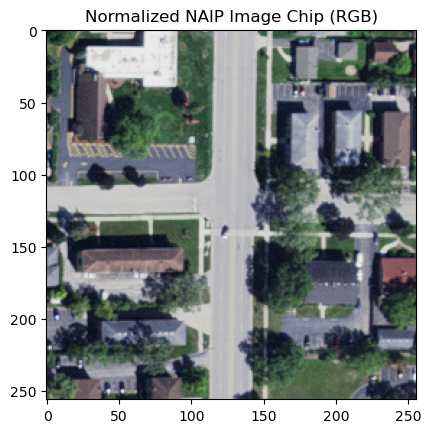

In [ ]:
# collate function to handle geospatial data
def custom_collate(batch):
    """Custom collate function to filter out unsupported fields for PyTorch DataLoader."""
    collated_batch = {}
    for key in batch[0]:  # get keys from the first element in the batch
        if key != 'crs':  # ignore CRS and other unsupported fields
            collated_batch[key] = [item[key] for item in batch]
    return collated_batch

# DataLoader with the custom collate function
dataloader = DataLoader(naip_dataset, sampler=sampler, batch_size=1, collate_fn=custom_collate)

# process and visualize a sample chip
print("Processing and visualizing a sample chip...")
for batch in dataloader:
    # Extract and normalize the image chip
    image_chip = batch['image'][0].numpy().transpose(1, 2, 0)  # convert to HWC format
    break  # process only the first chip for now

# continue with visualization steps
if image_chip.shape[-1] == 4:  # If RGBA, remove alpha channel
    image_chip_rgb = image_chip[:, :, :3]
else:
    image_chip_rgb = image_chip

# normalize for display
normalized_chip = (image_chip_rgb - image_chip_rgb.min()) / (image_chip_rgb.max() - image_chip_rgb.min()) * 255
normalized_chip = normalized_chip.astype(np.uint8)

plt.imshow(normalized_chip)
plt.title("Normalized NAIP Image Chip (RGB)")
plt.show()

Loading GIBI shapefile...
GIBI shapefile loaded.
Shapefile CRS: EPSG:4326
Loading NAIP dataset...
NAIP dataset loaded.
NAIP CRS: EPSG:26916
Reprojecting shapefile to match NAIP CRS...
Processing and visualizing multiple chips...


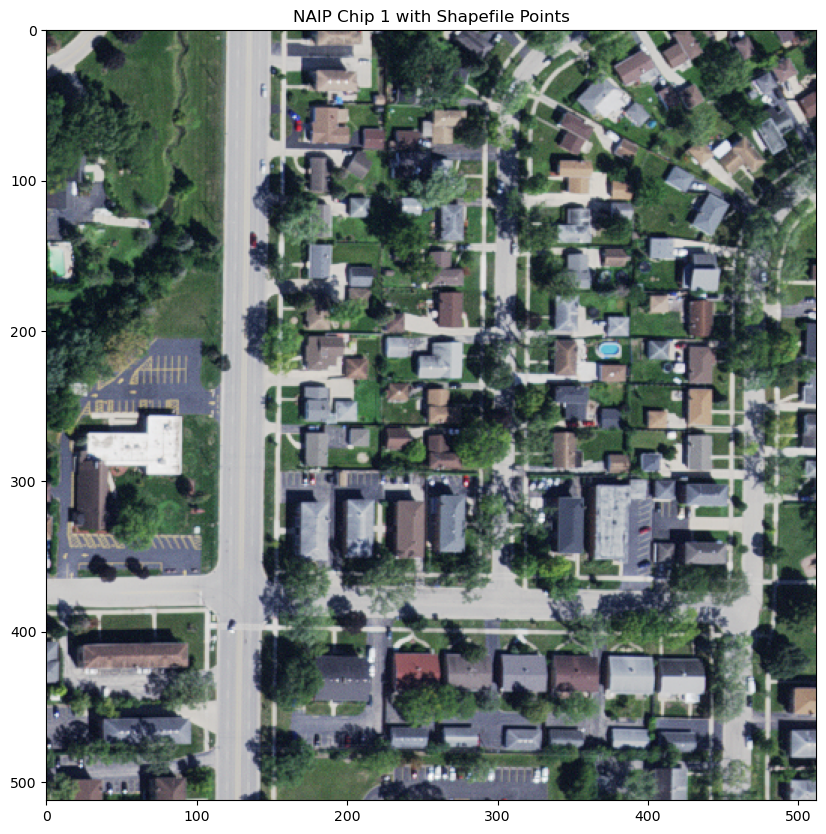

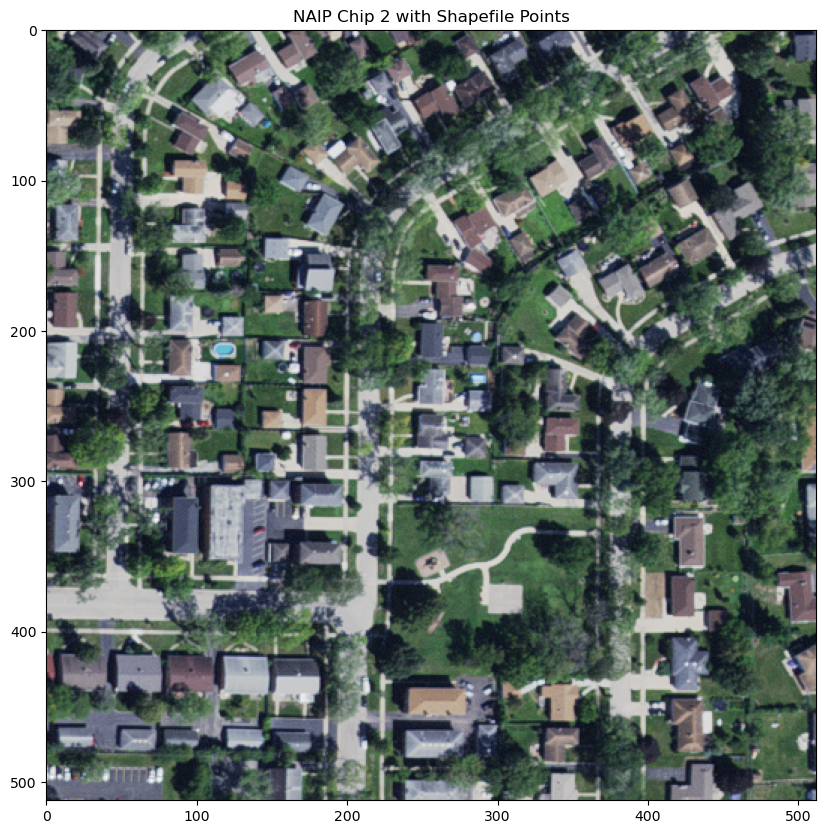

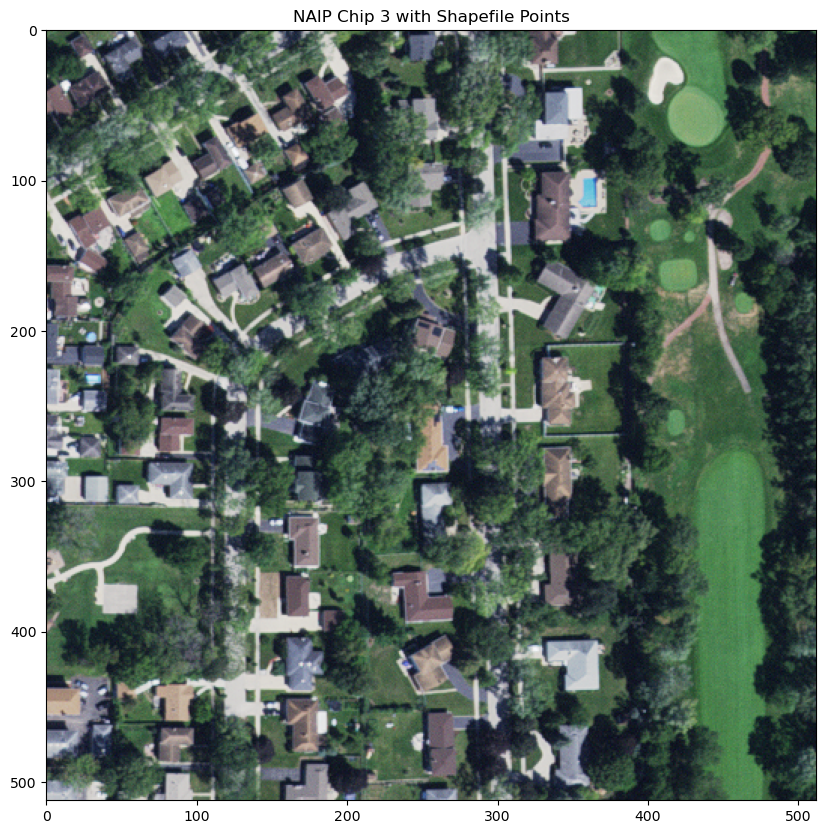

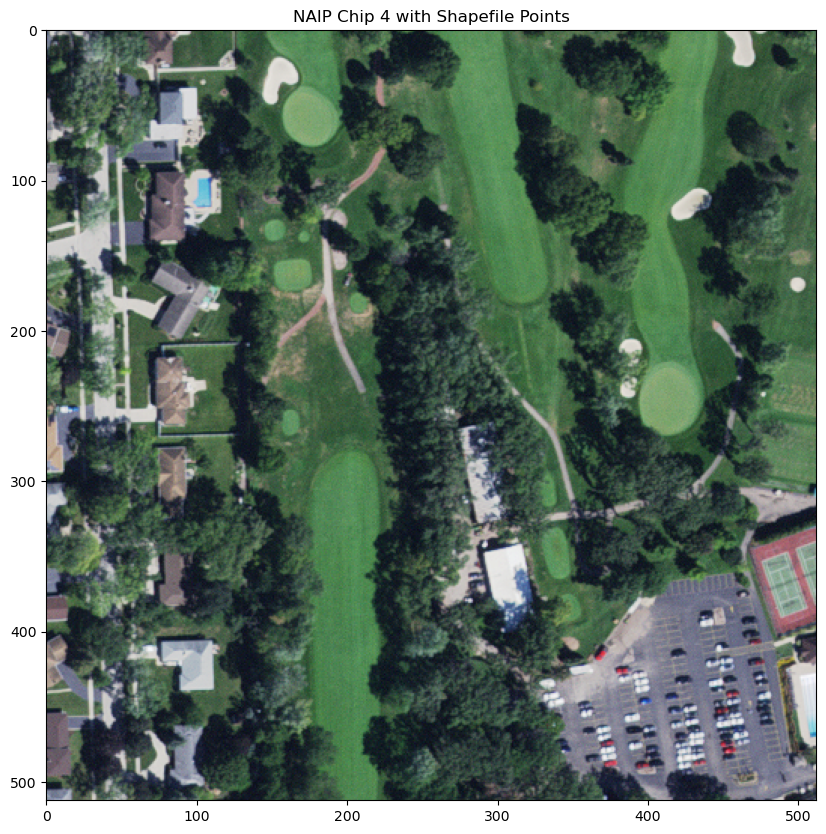

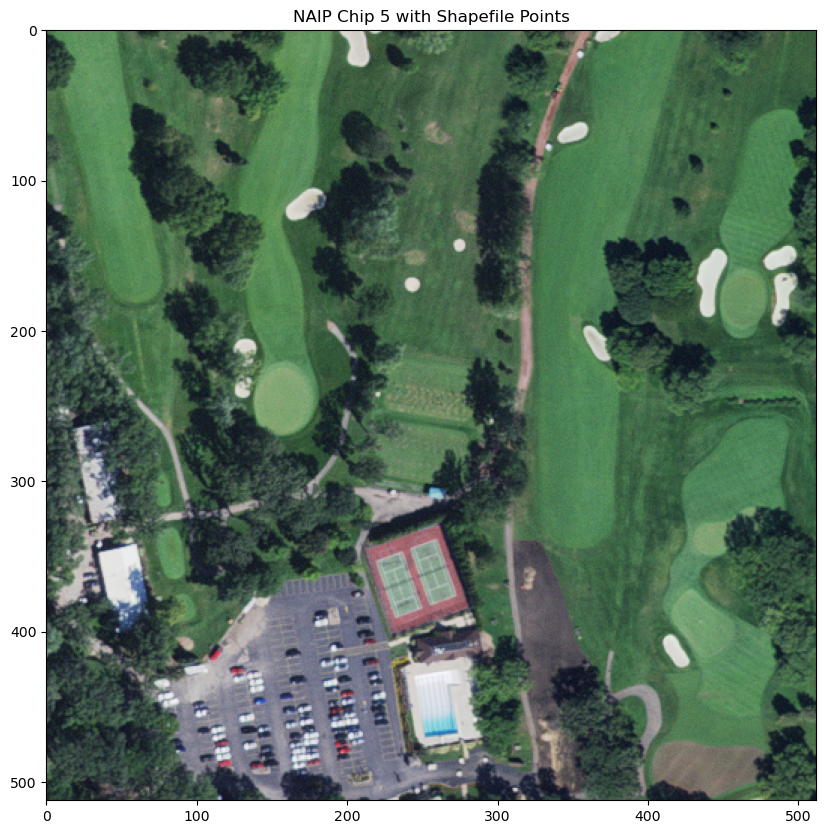

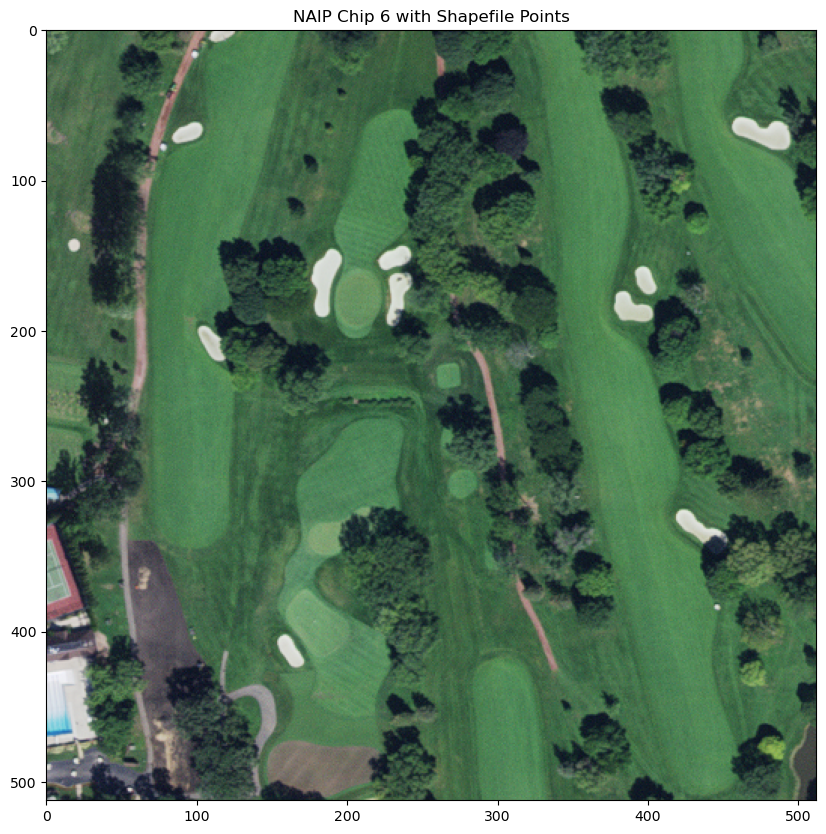

Displayed 5 chips. Stopping visualization.


In [34]:
import torch
from torchgeo.datasets import NAIP
from torchgeo.samplers import GridGeoSampler
from torch.utils.data import DataLoader
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
from rasterio.transform import from_bounds

# File paths
gibi_shapefile_path = "/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp"
naip_image_dir = "/net/projects/cmap/data/GIBI-images"

# Load shapefile using GeoPandas
print("Loading GIBI shapefile...")
gdf = gpd.read_file(gibi_shapefile_path)
print("GIBI shapefile loaded.")
print("Shapefile CRS:", gdf.crs)

# Load NAIP dataset using torchgeo
print("Loading NAIP dataset...")
naip_dataset = NAIP(naip_image_dir)
print("NAIP dataset loaded.")
print("NAIP CRS:", naip_dataset.crs)

# Transform shapefile CRS if needed
if gdf.crs != naip_dataset.crs:
    print("Reprojecting shapefile to match NAIP CRS...")
    gdf = gdf.to_crs(naip_dataset.crs)

# Initialize the sampler with larger tiles and a smaller stride to cover more area
sampler = GridGeoSampler(naip_dataset, size=512, stride=256)

# Define a custom collate function to handle geospatial data in PyTorch DataLoader
def custom_collate(batch):
    """Custom collate function to filter out unsupported fields for PyTorch DataLoader."""
    collated_batch = {}
    for key in batch[0]:  # Get keys from the first element in the batch
        if key != 'crs':  # Ignore CRS and other unsupported fields
            collated_batch[key] = [item[key] for item in batch]
    return collated_batch

# Initialize DataLoader with the custom collate function
dataloader = DataLoader(naip_dataset, sampler=sampler, batch_size=1, collate_fn=custom_collate)

# Function to transform geometry to pixel coordinates
def scale_geometry_to_pixels(geometry, bbox, img_width, img_height):
    """Scale geometry points to pixel coordinates based on bounding box and image dimensions."""
    def scale_point(x, y):
        normalized_x = (x - bbox.minx) / (bbox.maxx - bbox.minx)
        normalized_y = (y - bbox.miny) / (bbox.maxy - bbox.miny)
        pixel_x = normalized_x * img_width
        pixel_y = (1 - normalized_y) * img_height  # Invert y-axis for display
        return Point(pixel_x, pixel_y)

    if geometry.geom_type == "Point":
        return scale_point(geometry.x, geometry.y)
    else:
        return geometry.apply(lambda coord: scale_point(coord[0], coord[1]))

# Visualize multiple chips
print("Processing and visualizing multiple chips...")
for i, batch in enumerate(dataloader):
    # Extract and normalize the image chip
    image_chip = batch['image'][0].numpy().transpose(1, 2, 0)
    bbox = batch['bbox'][0]  # Get bounding box for the chip

    # Normalize chip for display
    if image_chip.shape[-1] == 4:  # Remove alpha channel if present
        image_chip = image_chip[:, :, :3]
    normalized_chip = (image_chip - image_chip.min()) / (image_chip.max() - image_chip.min()) * 255
    normalized_chip = normalized_chip.astype(np.uint8)

    # Transform shapefile points to pixel coordinates for the current chip
    gdf['geometry_pixels'] = gdf.geometry.apply(lambda geom: scale_geometry_to_pixels(geom, bbox, normalized_chip.shape[1], normalized_chip.shape[0]))

    # Filter out points that fall outside the chip bounds
    points_within_chip = gdf[gdf['geometry_pixels'].apply(lambda geom: geom.geom_type == "Point" and (0 <= geom.x <= normalized_chip.shape[1] and 0 <= geom.y <= normalized_chip.shape[0]))]

    # Plot the image chip
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(normalized_chip)
    ax.set_xlim(0, normalized_chip.shape[1])
    ax.set_ylim(normalized_chip.shape[0], 0)

    # Overlay points if any exist within this chip
    if not points_within_chip.empty:
        print(f"Overlaying {len(points_within_chip)} points on chip {i + 1}.")
        for geom in points_within_chip['geometry_pixels']:
            ax.plot(geom.x, geom.y, 'ro', markersize=5)

    plt.title(f"NAIP Chip {i + 1} with Shapefile Points")
    plt.show()

    # Optionally limit the number of chips displayed
    if i >= 5:
        print("Displayed 5 chips. Stopping visualization.")
        break


Loading GIBI shapefile...
GIBI shapefile loaded.
Shapefile CRS: EPSG:4326
Processing image: /net/projects/cmap/data/GIBI-images/m_4108711_nw_16_060_20210908.tif
Raster CRS: EPSG:26916
Raster bounds: BoundingBox(left=437405.4, bottom=4628941.800000001, right=443293.80000000005, top=4636469.4)
Reprojecting shapefile to match raster CRS...
Overlaying 105 points on m_4108711_nw_16_060_20210908.tif.


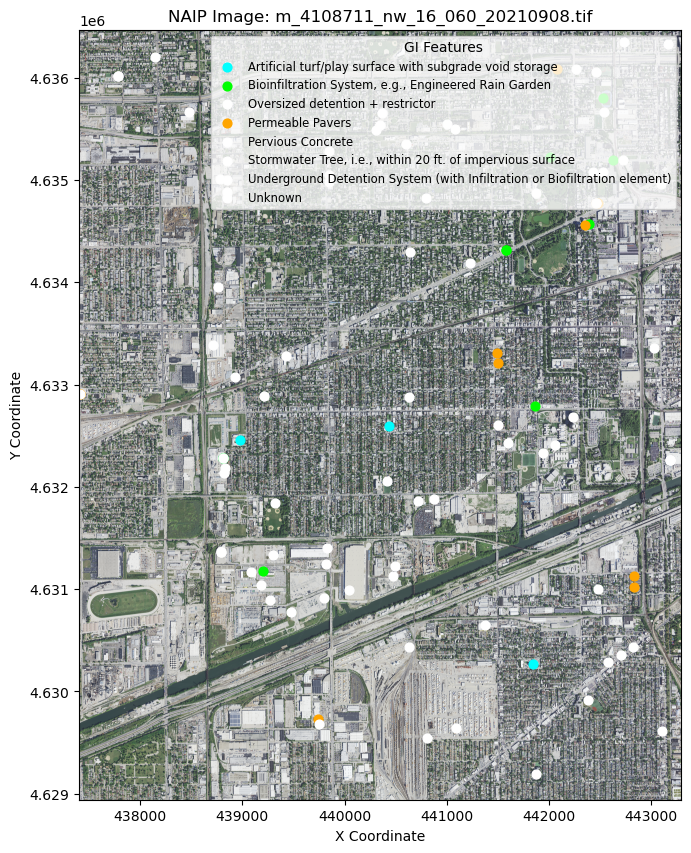

Processing image: /net/projects/cmap/data/GIBI-images/m_4108710_ne_16_060_20210908.tif
Raster CRS: EPSG:26916
Raster bounds: BoundingBox(left=432255.6, bottom=4628985.600000001, right=438066.0, top=4636516.2)
Overlaying 10 points on m_4108710_ne_16_060_20210908.tif.


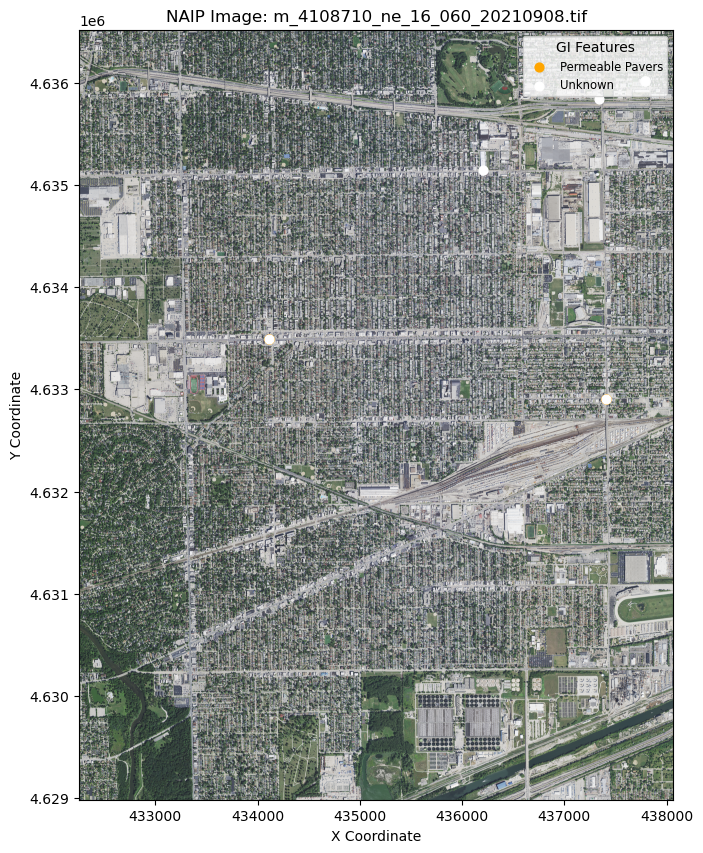

Processing image: /net/projects/cmap/data/GIBI-images/m_4108728_sw_16_060_20210908.tif
Raster CRS: EPSG:26916
Raster bounds: BoundingBox(left=447536.4, bottom=4594116.0, right=453439.80000000005, top=4601746.8)
Overlaying 8 points on m_4108728_sw_16_060_20210908.tif.


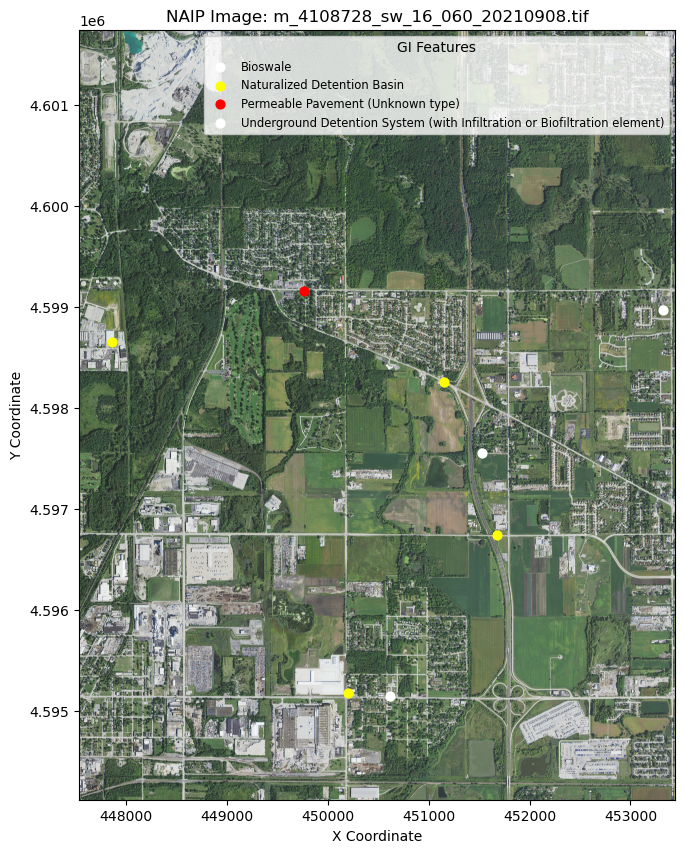

Processing image: /net/projects/cmap/data/GIBI-images/m_4108711_sw_16_060_20210908.tif
Raster CRS: EPSG:26916
Raster bounds: BoundingBox(left=437344.8, bottom=4621947.0, right=443238.6, top=4629585.6)
Overlaying 61 points on m_4108711_sw_16_060_20210908.tif.


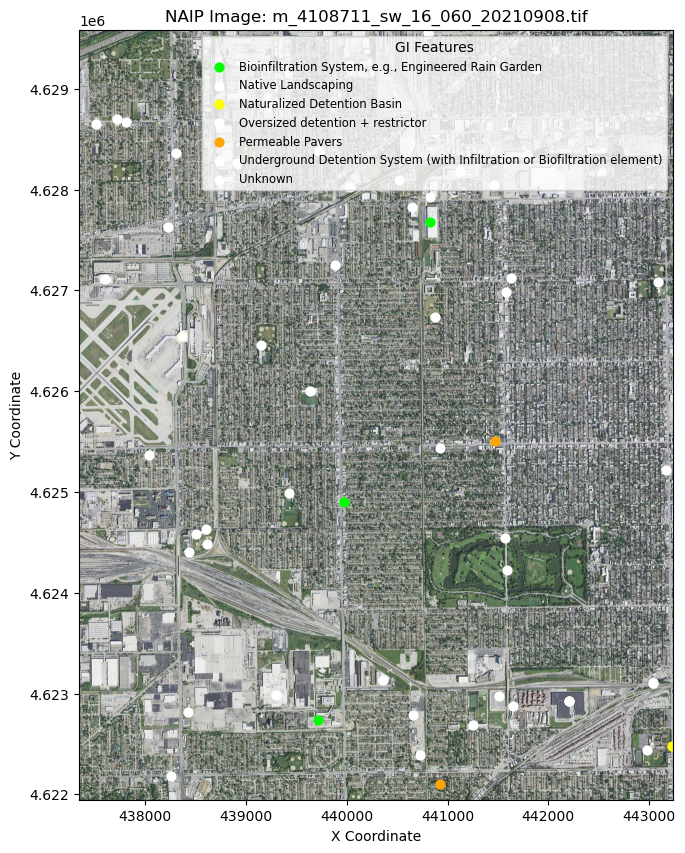

Processing image: /net/projects/cmap/data/GIBI-images/m_4108710_se_16_060_20210908.tif
Raster CRS: EPSG:26916
Raster bounds: BoundingBox(left=432189.6, bottom=4621990.800000001, right=438005.39999999997, top=4629632.4)
Overlaying 29 points on m_4108710_se_16_060_20210908.tif.


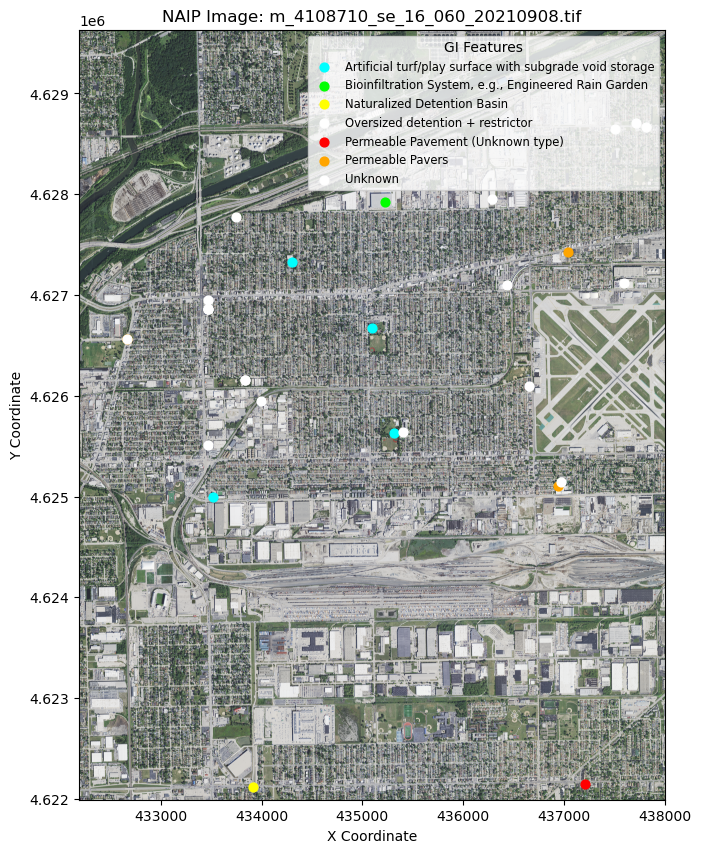

In [61]:
import os
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
from shapely.geometry import box
import matplotlib.patches as mpatches

# Paths
gibi_shapefile_path = "/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp"
naip_image_dir = "/net/projects/cmap/data/GIBI-images"

# Load shapefile
print("Loading GIBI shapefile...")
gdf = gpd.read_file(gibi_shapefile_path)
print("GIBI shapefile loaded.")
print(f"Shapefile CRS: {gdf.crs}")

# Get all .tif files from the NAIP directory
image_files = [f for f in os.listdir(naip_image_dir) if f.endswith(".tif")]
if not image_files:
    raise FileNotFoundError("No .tif files found in the specified directory.")

# Process up to 5 .tif files
for img_file in image_files[:5]:
    img_path = os.path.join(naip_image_dir, img_file)
    print(f"Processing image: {img_path}")

    # Open the raster file
    with rasterio.open(img_path) as src:
        print(f"Raster CRS: {src.crs}")
        print(f"Raster bounds: {src.bounds}")

        # Ensure CRS consistency between shapefile and raster
        if gdf.crs != src.crs:
            print("Reprojecting shapefile to match raster CRS...")
            gdf = gdf.to_crs(src.crs)

        # Find points within the raster bounds
        bbox = box(*src.bounds)
        intersecting_pts = gdf[gdf["geometry"].intersects(bbox)]

        # Plot the raster image
        fig, ax = plt.subplots(figsize=(10, 10))
        show(src, ax=ax, cmap="gray")
        ax.set_title(f"NAIP Image: {img_file}")

        # Check if there are points to overlay
        if not intersecting_pts.empty:
            print(f"Overlaying {len(intersecting_pts)} points on {img_file}.")

            # Group points by 'GI_Type'
            feature_column = 'GI_Type'
            feature_groups = intersecting_pts.groupby(feature_column)

            # Define a new color map and legend for better contrast
            color_map = {
                "Artificial turf/play surface with subgrade void storage": "cyan",
                "Bioinfiltration System, e.g., Engineered Rain Garden": "lime",
                "Naturalized Detention Basin": "yellow",
                "Oversized detention + restrictor": "magenta",
                "Permeable Pavement (Unknown type)": "red",
                "Permeable Pavers": "orange",
                "Unknown": "white"
            }

            # Define marker size for better visibility
            point_size = 40

            # Plot points with color-coded features
            for feature_type, pts in feature_groups:
                color = color_map.get(feature_type, "white")
                pts.plot(ax=ax, color=color, markersize=point_size, label=feature_type)

            # Add legend to the plot
            plt.legend(loc='upper right', fontsize='small', title="GI Features")

        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.show()



In [85]:
# code to load the NAIP data per-chip using torchgeo


import torch
from torchgeo.datasets import NAIP
from torchgeo.samplers import GridGeoSampler
from torch.utils.data import DataLoader
import geopandas as gpd
from shapely.geometry import box
from shapely.ops import transform as shapely_transform
import matplotlib.pyplot as plt
import rasterio
import numpy as np

# Paths
gibi_shapefile_path = "/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp"
naip_image_dir = "/net/projects/cmap/data/GIBI-images"

# Load shapefile
print("Loading GIBI shapefile...")
gdf = gpd.read_file(gibi_shapefile_path)
print("GIBI Shapefile loaded.")

# Load NAIP dataset
print("Loading NAIP dataset...")
naip_dataset = NAIP(naip_image_dir)
print("NAIP dataset loaded.")

# Reproject shapefile to match NAIP CRS
if gdf.crs != naip_dataset.crs:
    print("Reprojecting shapefile to match NAIP CRS...")
    gdf = gdf.to_crs(naip_dataset.crs)

# Initialize the sampler and dataloader
sampler = GridGeoSampler(naip_dataset, size=512, stride=512)
dataloader = DataLoader(naip_dataset, sampler=sampler, batch_size=1, collate_fn=lambda x: x[0])

# Helper function to transform geometry
def transform_geometry_to_pixels(geometry, affine_transform):
    """Convert geometry to pixel coordinates using affine transform."""
    return geometry.apply(
        lambda geom: shapely_transform(
            lambda x, y: rasterio.transform.rowcol(affine_transform, x, y, op=float),
            geom,
        )
    )

# Process a batch
for batch in dataloader:
    chip_bbox = batch['bbox']
    chip_bbox_2d = (chip_bbox.minx, chip_bbox.miny, chip_bbox.maxx, chip_bbox.maxy)
    image_chip = batch['image'].numpy().transpose(1, 2, 0)

    # Normalize image for visualization
    if image_chip.shape[-1] == 4:  # Remove alpha channel if present
        image_chip = image_chip[:, :, :3]
    normalized_chip = (image_chip - image_chip.min()) / (image_chip.max() - image_chip.min()) * 255
    normalized_chip = normalized_chip.astype(np.uint8)

    # Find points within the current chip's bounding box
    bbox_geom = box(*chip_bbox_2d)
    points_within_bbox = gdf[gdf.intersects(bbox_geom)]

    if points_within_bbox.empty:
        print("No points within this chip's bounding box. Skipping...")
        continue

    # Open the raster file to get the affine transform
    sample_file_path = naip_dataset.index.intersection(chip_bbox_2d)[0]
    print(f"Processing image file: {sample_file_path}")

    with rasterio.open(sample_file_path) as src:
        chip_transform = src.transform

    # Transform shapefile points to pixel coordinates
    points_within_bbox['geometry_pixels'] = transform_geometry_to_pixels(points_within_bbox['geometry'], chip_transform)

    # Plot the image with points
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(normalized_chip, aspect='auto')
    ax.set_title("NAIP Image Chip with GIBI Points Overlay")

    for _, row in points_within_bbox.iterrows():
        geom = row['geometry_pixels']
        if geom.geom_type == "Point":
            ax.plot(geom.x, geom.y, "ro", markersize=8)

    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.show()

    break  # Stop after one batch for debugging


Loading GIBI shapefile...
GIBI Shapefile loaded.
Loading NAIP dataset...
NAIP dataset loaded.
Reprojecting shapefile to match NAIP CRS...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding box. Skipping...
No points within this chip's bounding

RTreeError: Coordinates must be in the form (minx, miny, maxx, maxy) or (x, y) for 2D indexes

In [90]:
import os
import sys
import torch
from torchgeo.datasets import BoundingBox
from torchgeo.samplers import GridGeoSampler
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import matplotlib.patches as mpatches
from shapely.geometry import box


gibi_module_path = "/home/gregoryc25/CMAP/data"
sys.path.append(gibi_module_path)

from gibi import GIBIDataset


# Paths
gibi_shapefile_path = "/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp"
naip_image_dir = "/net/projects/cmap/data/GIBI-images"

# Load the GIBI dataset
print("Loading GIBI dataset...")
configs = (None, {"Bioinfiltration": 1, "Pond": 2}, 512, "EPSG:26916", 1.0)
gibi_dataset = GIBIDataset(gibi_shapefile_path, configs)

# Process up to 5 .tif files
image_files = [f for f in os.listdir(naip_image_dir) if f.endswith(".tif")]
if not image_files:
    raise FileNotFoundError("No .tif files found in the specified directory.")

for img_file in image_files[:5]:
    img_path = os.path.join(naip_image_dir, img_file)
    print(f"Processing image: {img_path}")

    # Open the raster file
    with rasterio.open(img_path) as src:
        print(f"Raster CRS: {src.crs}")
        print(f"Raster bounds: {src.bounds}")

        # Ensure CRS consistency
        if gibi_dataset.crs != src.crs:
            print("Reprojecting GIBI dataset to match raster CRS...")
            gibi_dataset.gdf = gibi_dataset.gdf.to_crs(src.crs)

        # Convert raster bounds to BoundingBox
        minx, miny, maxx, maxy = src.bounds
        query = BoundingBox(minx=minx, miny=miny, maxx=maxx, maxy=maxy, mint=0, maxt=sys.maxsize)

        # Query the dataset for features within the bounding box
        try:
            sample = gibi_dataset[query]
            mask = sample["mask"].numpy()
        except IndexError:
            print(f"No features found in the dataset for bounding box {query}.")
            continue

        # Plot the raster image
        fig, ax = plt.subplots(figsize=(10, 10))
        show(src, ax=ax, cmap="gray")
        ax.set_title(f"NAIP Image: {img_file}")

        # Overlay the mask
        plt.imshow(mask, alpha=0.5, cmap="jet")

        # Add legend (if needed) for color-coded features
        patches = [mpatches.Patch(color="blue", label="Feature Type 1"), mpatches.Patch(color="red", label="Feature Type 2")]
        plt.legend(handles=patches, loc='upper right')

        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.show()


Loading GIBI dataset...


FileNotFoundError: No data found in `path='/net/projects/cmap/data/GIBI_2021_shapefiles/GIBI_All.shp'`